<a href="https://colab.research.google.com/github/leoUninova/Batch-TA-SI-/blob/master/batch3_tasi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#useful links importing google sheets: 
* https://colab.research.google.com/notebooks/io.ipynb#scrollTo=JiJVCmu3dhFa

* http://www.indjango.com/access-google-sheets-in-python-using-gspread/
* https://medium.com/@vince.shields913/reading-google-sheets-into-a-pandas-dataframe-with-gspread-and-oauth2-375b932be7bf read withe the right headers


In [0]:
#@title Install packagages to read czi files 
pip install -q czifile

In [0]:
#@title mount drive 

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
#@title import packaged and mount drive
import pandas as pd
from czifile import CziFile
import os 
import glob
from matplotlib import pylab
import matplotlib.pyplot as plt
from google.colab import widgets



In [0]:
#@title Display tables and sheet list functions / display images and load czi 
def sheet_list(name): 
  listOfdf=[]
  listOfStr=[]
  sh = gc.open(name)
  for i in range (len(sh.worksheets())):
    worksheet=sh.get_worksheet(i)
    rows = worksheet.get_all_values()
    headers = rows.pop(0)
    df = pd.DataFrame(rows, columns=headers)
    listOfdf.append(df)
    listOfStr.append(sh.get_worksheet(i).title)
  zipbObj = zip(listOfStr, listOfdf)
  dictOfWords = dict(zipbObj)
  return dictOfWords

def DisplayTables(dfdict):
  tb = widgets.TabBar(list(dfdict.keys()))
  for i, values in enumerate (dfdict.values()):
    with tb.output_to(i, select=(i < 1)):
      display(values)
      
      
#display images and load czi 
def dataczi (files):
  listOfarray=[]
  for idx, file in enumerate(files):
    with CziFile(file) as czi:
        image_arrays = czi.asarray()
    images=image_arrays[0]    
    listOfarray.append(images)
  zipbObj = zip(files, listOfarray)
  dictOfWords = dict(zipbObj)
  return dictOfWords


def DisplayImages(imdict):
  tb = widgets.TabBar(list(imdict.keys()))
  for i, values in enumerate (imdict.values()):
    with tb.output_to(i, select=(i < 1)):
      fig, ax = plt.subplots(figsize=(14, 10))
      ax.imshow(values)
      pylab.show()
        
      
  


In [0]:
#@title authroize setup google sheets
from google.colab import auth
auth.authenticate_user()

import gspread
from oauth2client.client import GoogleCredentials

gc = gspread.authorize(GoogleCredentials.get_application_default())

In [0]:
#@title import sheet, get titles of different sheets, create dictionray with dataframes
#http://www.indjango.com/access-google-sheets-in-python-using-gspread/
sh = gc.open("TASI BACTH")
worksheet_list = sh.worksheets()

#create dictioanry with dataframe of sheets, keys are the names of the sheets 
tabledic=sheet_list("TASI BACTH")



#Ta-si batch

12 transistors were fabricated. Varying: the thickness (150, 250) and the composition (Si-TA, Si-Ta-Si, Ta-Si) of the dielectric; and the Semiconductor annealing Temperature (180, 300). 



In [0]:
#@title Intro sheet and overivew all tables { run: "auto", vertical-output: true }


Show = False #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DisplayTables(tabledic)


#Issues in Development process

There were many developpment issues for most layers. 
The first issue in the Mo-G layer can be due to the lack of developper. 



## MO-Gate Developpment

The standard parameters followed previously are: 

>prebake (T, time) | exposure (type, time) | postbake (T, time)
>--- | --- | --- 
>90, 60 | s, 6| 110, 60


I developped the first sample with Ana. When usuccesfull,  she suggested inserting a  **preheat of (110, 60)**. 
The standard here for '"good" development was lowered due to big issues getting photoresist to come out. There is a large amount of photoresist that needs to come out every time, making the developper dirty fast. The **lack of developer** meant using low quality developper. 

Some samples were developed **without  preheating** and there was **no difference**. 
Ring-like shapes apppeared, probably due to using dirty developper or not enough of it. 

In [0]:
#@title MO-G Developpment { run: "auto" }  
Show = False #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Mo-G-development', )}
  DisplayTables(DIE3)

## Dielectric - development 250nm 

The standard parameters used in previous bacthes are: 

>prebake (T, time) | exposure (type, time) | postbake (T, time)
>--- | --- | --- 
>90, 60 | s, 7| 110, 60

I started off following what i had done in other batches **(no pre-heat)**. 

As for the gate, the bar for  "good" was low due to development issues in the previous weeks. The "red line problem" was identified  as photoresist coming out. This occured with development time so as low as 40 secondds. 

Since: 
*  Incrase exposure time --> increases differencce between exposed and unexposed--> shorted development time 

I decreased exposure **time to 6.5 seconds** closer to the range i had used other times. Porbably would have been better to incrase exposure time and decrease development time. 


Maria suggested this method: 
* Develop  until you see a glimpe of holes opening (light differences on pads) --> post heat sample 


In [0]:
#@title DIE developmenet 250 nm table { run: "auto" }


Show = False #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Die-development-250nm', )}
  DisplayTables(DIE3)
 

## Dielectric - development 150nm 

In [0]:
#@title DIE developmenet 150 nm table { run: "auto" }

Show = False #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'Die-development-150nm', )}
  DisplayTables(DIE3)
 

##DIE development DAY 3 
I evaluated which samples had been etched properely. Some samples were etched but not completely. Others i was unsure about. I decided to redo all the samples i was unsure about. 
Since **postbake** increases adhesion, Ana suggested removing it. Also **preheat** was removed.
All the samples developed well, there were no issues throughout the development. This day was the first day in which **the room had better climate control. Perhaps the heat was affecting development.**

In [0]:
#@title DIE developmenet day 3: Evaluation and table { run: "auto" }
Show = False #@param {type:"boolean"}

#commented out since it is already in memory 
# tabledic=sheet_list("TASI BACTH")

if Show:
  DIE3={k: tabledic[k] for k in ('Die-dev-day3-before-starting', 'Die-development-day3')}
  DisplayTables(DIE3)



## Semiconductor development
The semiconductor was developed in **lift off**.  I used a different **photoresist** 3007 instead of 3012. There were no problems with the development. There were 0 issues after 6 developemnts, so i stopped taking notes. 

In [0]:
#@title Semiconductor development: table { run: "auto" }

Show = False #@param {type:"boolean"}
if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'dev semi', )}
  DisplayTables(DIE3)
 

## S-D Development 
Only 1 sample had to be re-developed.Varying the time of the development did not affect the results.  I used the **3012 photoresist**, indicating that it wasn't the photoresit the issue.

In [0]:
#@title SD-development : table { run: "auto" }


Show = False #@param {type:"boolean"}

if Show:
#   DIE3=tabledic['SD-development ']
  DIE3={k: tabledic[k] for k in ( 'SD-development ', )}
  DisplayTables(DIE3)


#Post heating Bubble formation.

After the annealing step, bubbles appeared on the Gate structure. These strucures were not present before. There does not appear to  be a pattern betwee the Temperature  **(180:even, 300: odd)**  or the Dielectric structure (in pairs by 2) . 




 ### dictioanries from folders 

In [0]:
#@title dictioanries from folders 
os.chdir('/content/drive/My Drive/Images-microsope/seecond/')
folders=next(os.walk('.'))[1] 


def dataczi (files):
  listOfarray=[]
  number=[]
  name=[]
  for idx, file in enumerate(files):
    with CziFile(file) as czi: #get image as array from czi format
        image_arrays = czi.asarray()
    images=image_arrays[0]    
    listOfarray.append(images)
    number.append(file[:file.find('-')])
    name.append(file[file.find('-'):])
  #create dictionary
  dct = {x: {str(y): z } for x, y, z in zip(number,name,listOfarray)}
  return dct


os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[0])
images_files= glob.glob('*.czi')      
dicimagename= dataczi(images_files)

os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[2])
images_files= glob.glob('*.czi')
dicimagename2= dataczi(images_files)

In [0]:
#@title dictionary to image plot
# def keyd (key, d): 
#   if key in d:
    
#     return d
#   else: 
#     d[key]='no data '
#     return d
   
    
    
# def create_tab(location, wid1, wid2):
#   tb = widgets.TabBar([wid1, wid2], location=location)
#   with tb.output_to(wid1,  select=(i < 1)):
#       fig, ax = plt.subplots(figsize=(14, 10))
#       ax.imshow(a)
#       pylab.show()

#   with tb.output_to(wid2,  select=(i < 1)):
#       fig, ax = plt.subplots(figsize=(14, 10))
#       ax.imshow(b)
#       pylab.show()
      
# # tb = widgets.TabBar(list(dicimagename2.keys()))
# keys=list(set(list(dicimagename.keys())+ list(dicimagename2.keys())))
# tb=widgets.TabBar(keys)

# for i, k in enumerate(keys):
#   dicimagename=keyd(k, dicimagename)
#   dicimagename2=keyd(k, dicimagename2)
#   dic1, dic2 = dicimagename[k], dicimagename2[k]
#   (k_a,), (a,), (k_b,), (b,) = dic1.keys(), dic1.values(), dic2.keys(), dic2.values()
#   with tb.output_to(i, select=(i < 1)):
#     create_tab('start', k_a, k_b)
  
    

### code im using (pands dataframe)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

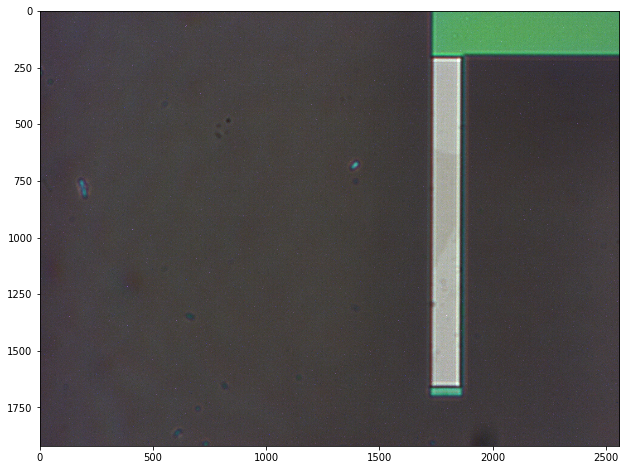

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

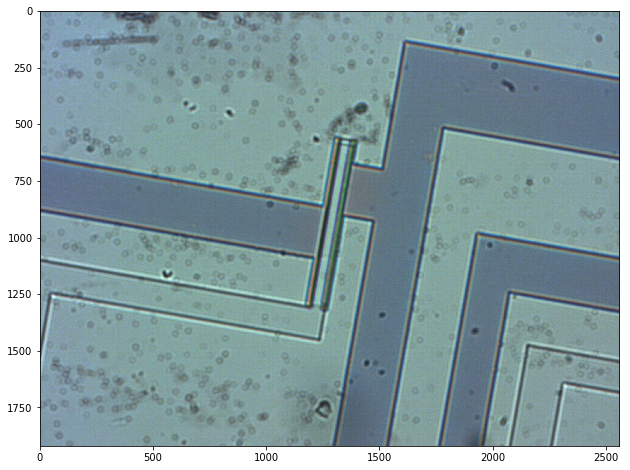

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

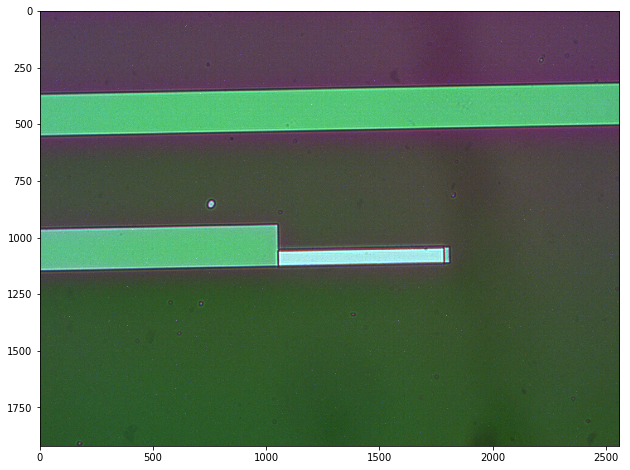

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

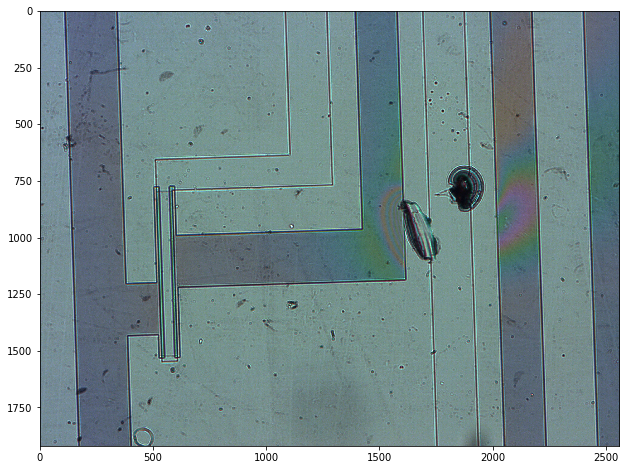

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

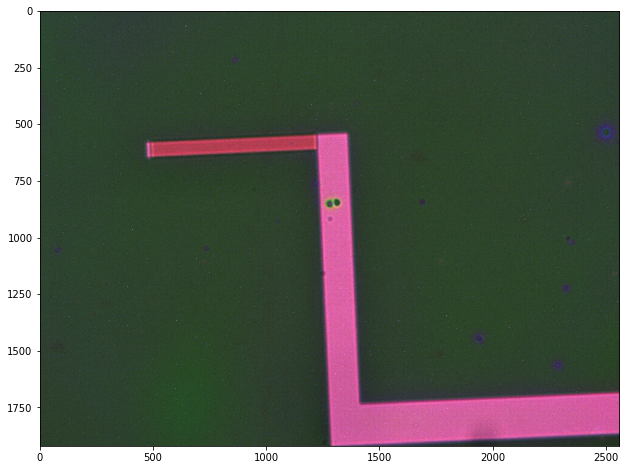

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

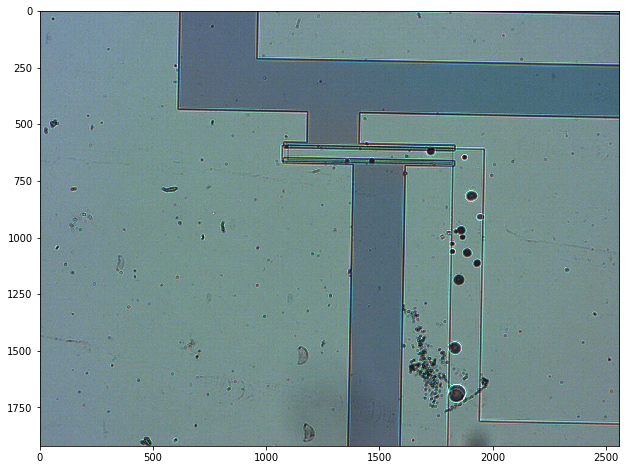

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

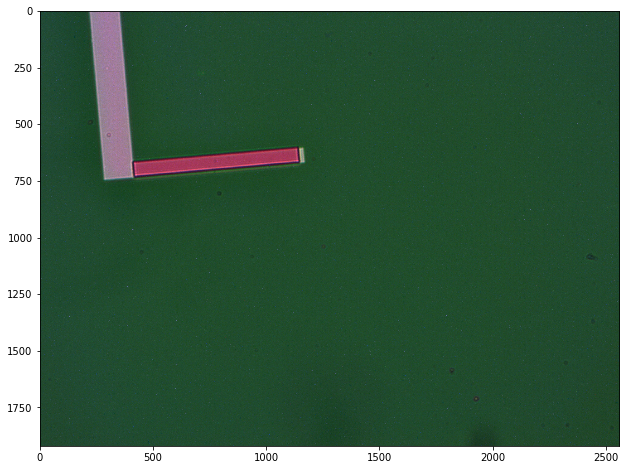

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

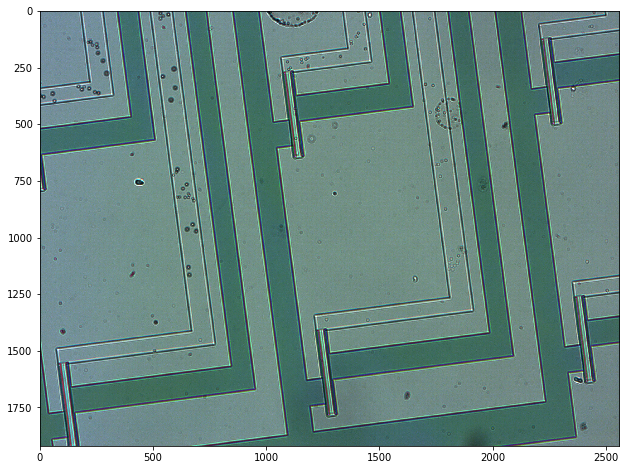

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

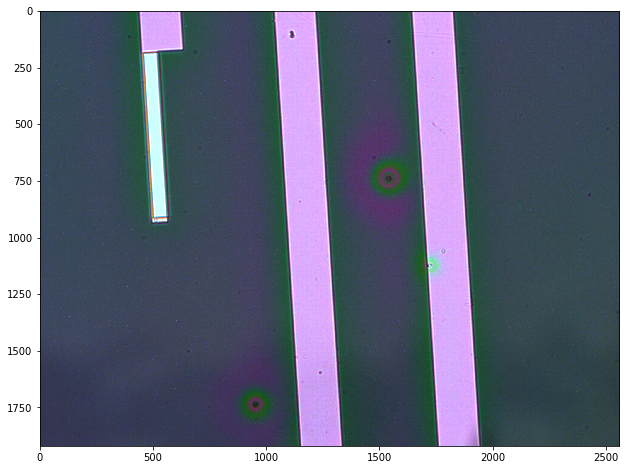

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

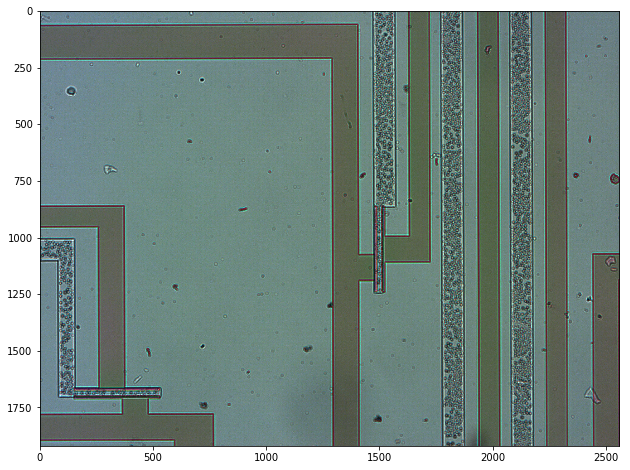

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

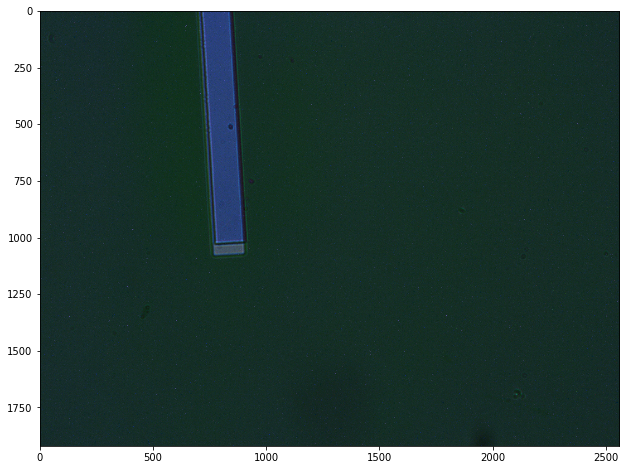

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

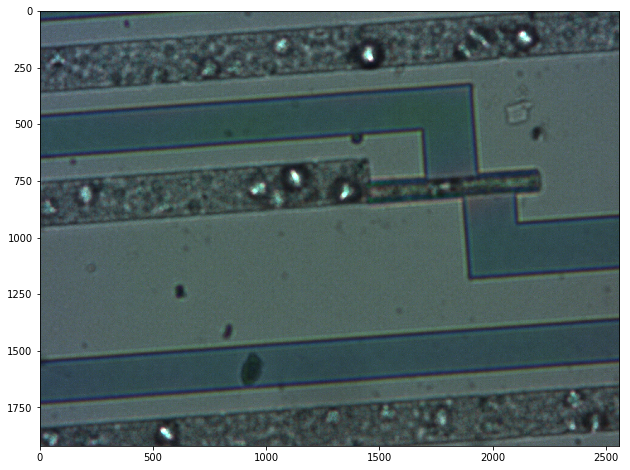

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

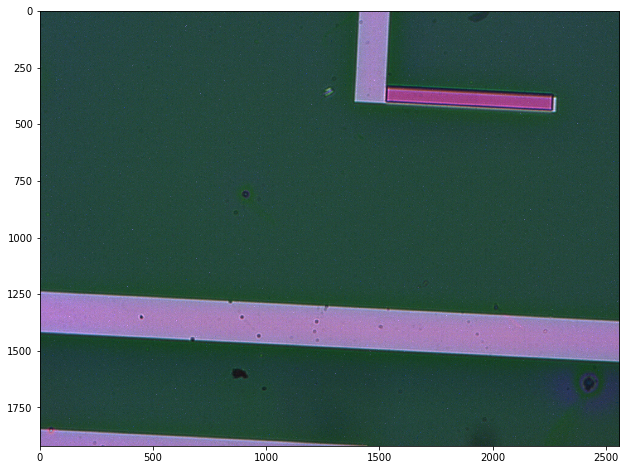

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

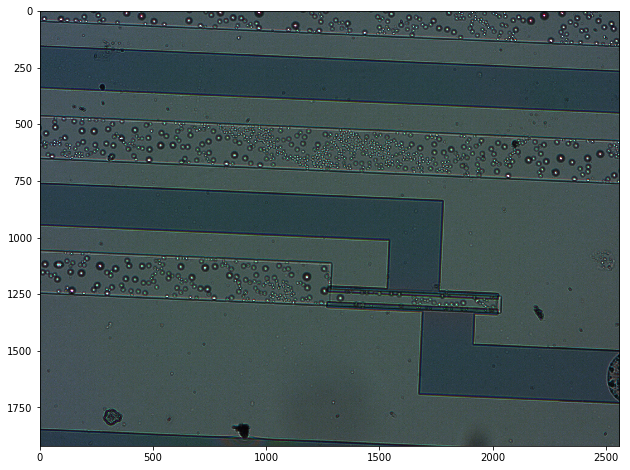

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

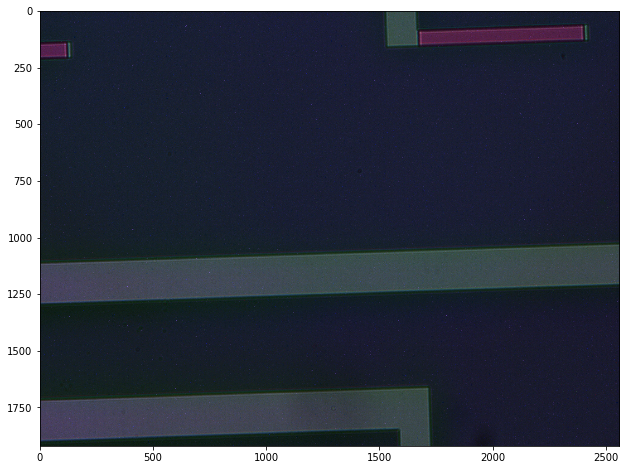

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

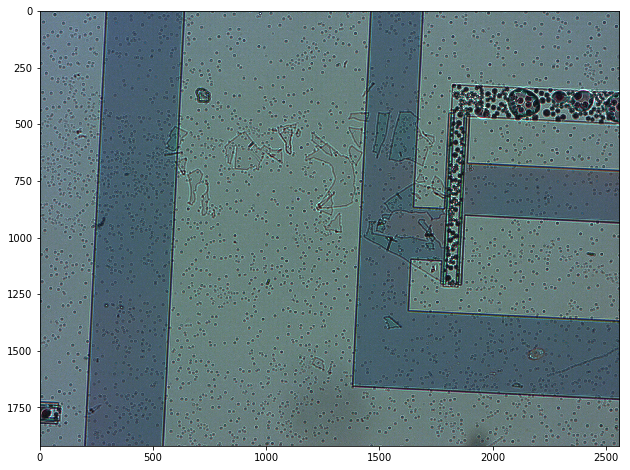

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

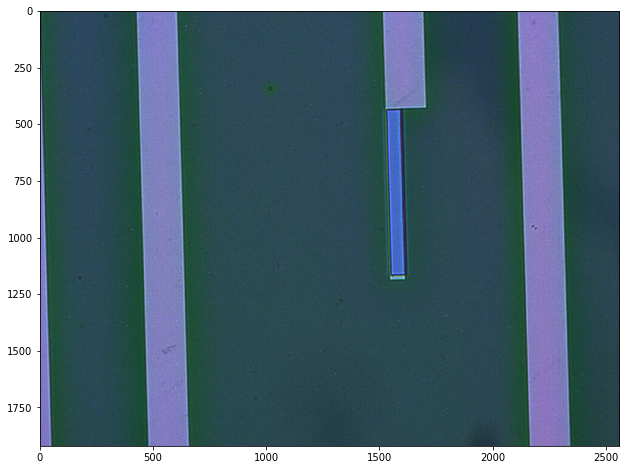

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

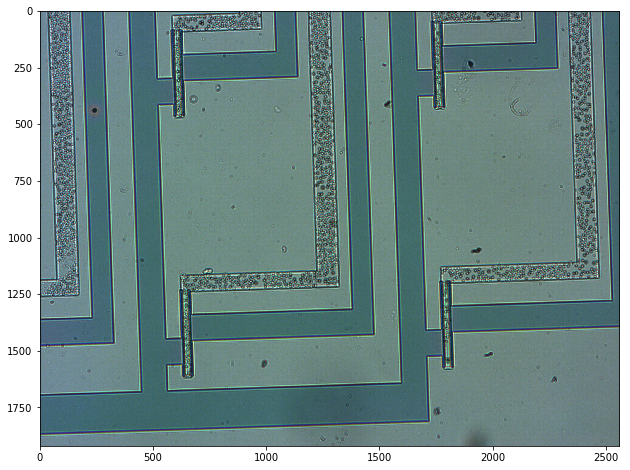

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

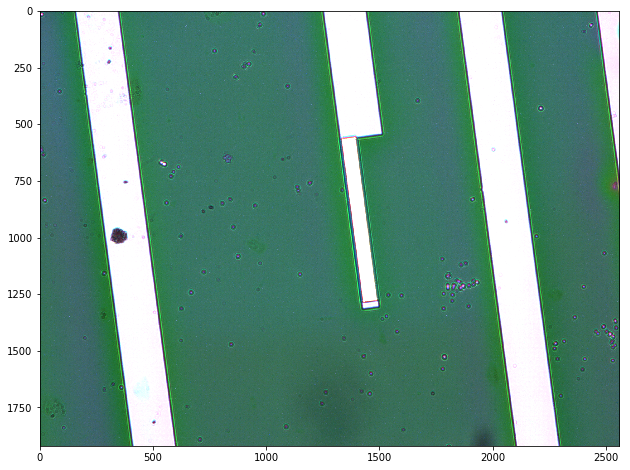

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

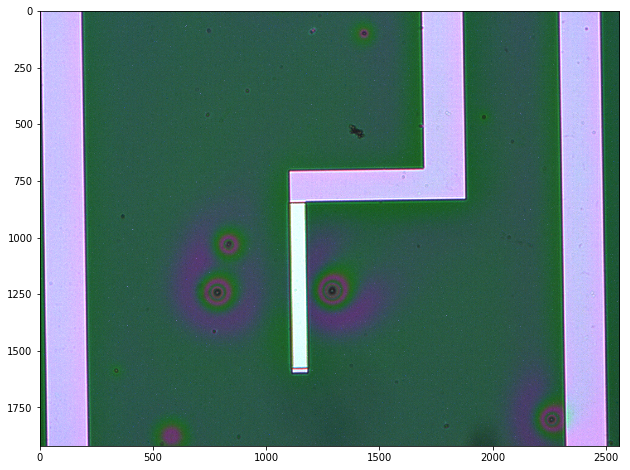

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

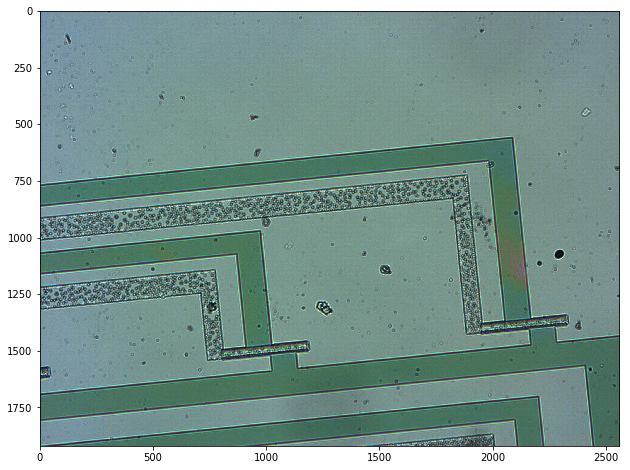

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

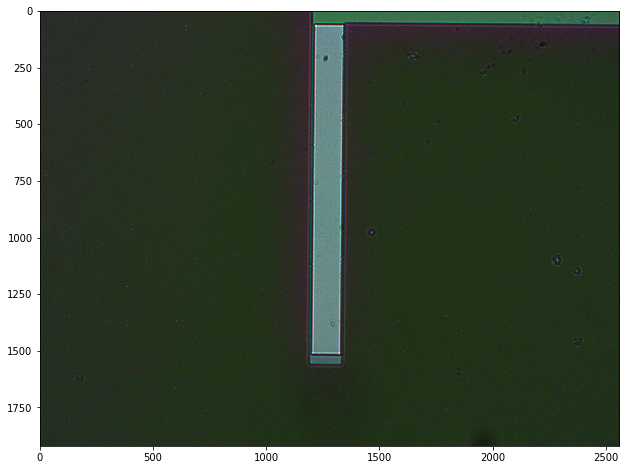

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

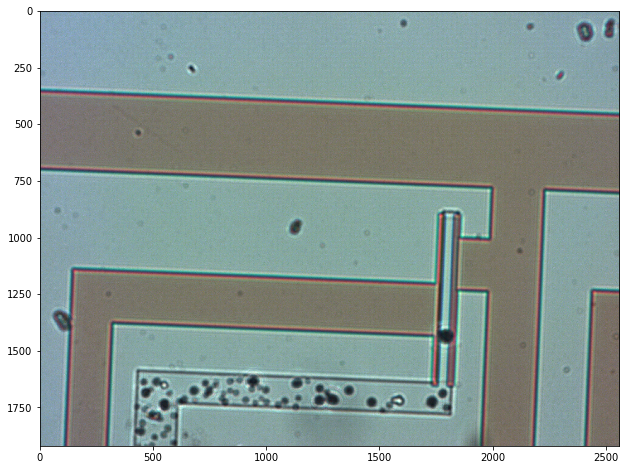

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
#@title 2 images folder Thing
def dataczi (files):
  number=[]
  name=[]
  for idx, file in enumerate(files):
    number.append(file[:file.find('-')])
    name.append(file[file.find('-'):])
  #create dictionary
  dct = {x: {str(y): z } for x, y, z in zip(number,name,files)}
  return dct

os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[0])
images_files= glob.glob('*.czi')      
dicimagename= dataczi(images_files)
df=pd.DataFrame(dataczi(images_files))
os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[2])
images_files= glob.glob('*.czi')
dicimagename2= dataczi(images_files)

df=pd.concat([df,pd.DataFrame(dataczi(images_files))] )

def create_tab(location, wid1, wid2):
  tb = widgets.TabBar([wid1, wid2], location=location)
  with tb.output_to(wid1,  select=(i < 1)):
    if pd.notnull(df.iloc[0][i]):
      os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[0])
      with CziFile(str(df.iloc[0][i])) as czi: #get image as array from czi format
        image_arrays = czi.asarray()
      images=image_arrays[0] 
      fig, ax = plt.subplots(figsize=(12, 8))
      ax.imshow(images)
      pylab.show()

  with tb.output_to(wid2,  select=(i < 1)):
    if pd.notnull(df.iloc[1][i]):
      os.chdir('/content/drive/My Drive/Images-microsope/seecond/' + folders[2])
      with CziFile(str(df.iloc[1][i])) as czi: #get image as array from czi format
        image_arrays = czi.asarray()
      images=image_arrays[0] 
      fig, ax = plt.subplots(figsize=(12, 8))
      ax.imshow(images)
      pylab.show()
      
tb = widgets.TabBar(list(df.columns))
for i, k in enumerate(list(df.columns)):
  with tb.output_to(i, select=(i < 1)):
    create_tab('start', df.index[0], df.index[1])



#Data analisis 



In [0]:
#@title Subsetting funciton
class Subsetting:   
    'do i want to pass a file every time i call subsetting or get the method and then use it as i please'

    
    def __init__(self):
        pass 
                    
                    
    def SubsetVariable ( self, data, *arg, **kwargs):  # https://stackoverflow.com/questions/22005911/convert-columns-to-string-in-pandas
        #print (data.loc[data.absIG==0])
        ''' 
        can pass **name_dict and it works.
        CHECK YOUR DATA DOESN'T HAVE .0 IF IT DOES YOU HAVE TO CALL IT WITH THAT !! 
        
        takes n argumments, joins them in a query, TRANFROMS DATASET TO STR , and gives back susett '''
        
        self.data=data
        
        qry = ' & '.join(["{} == '{}'".format(key,value) for key,value in kwargs.items()])        
        df=self.data.astype(str)
        subset=df.query(qry)
        self.subset=subset
   
    def SubsetUnique(self, data):
        data = data.drop_duplicates(subset='Names', keep='first')



In [0]:
#@title Plot functions (sat, lin, stab)

def stab_plot(data, leakage=False, title=False, show=True):
  'subset of the data '

  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer stab')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for stab')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(12, 8))
  if title: 
    fig.suptitle('stab ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'stab {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')



  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
    ax.plot(x,  y,  label=key, color=color)
    
    if leakage: 
      ax.plot(x, y2, color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])


  plt.legend(loc='best')
  if show: 
    plt.show()




def lin_plot (data, leakage, title=False, show=True):
  'subset of the data '
  
  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer lin')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for lin')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(12, 8))
  if title: 
    fig.suptitle('lin ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'lin {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')
  
  

  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
   
    ax.plot(x,  y,  label=key, color=color)
    
    if leakage: 
      ax.plot(x, y2, color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])
    
      
  plt.legend(loc='best')
  
  plt.show()

def sat_plot (data, leakage, title=False, show=True):
  'subset of the data '
  
  sub=Subsetting()
  temp=sub.SubsetVariable(data, Curve='Transfer sat')
  data=sub.subset.apply(pd.to_numeric, errors='ignore')
  #print (data.absIG.loc[data.absIG==0])
  'The plot'
  #data.reset_index()
  if data.empty:
    print ('passed empty dataframe for lin')
    return ('end') 
  
  fig, ax = plt.subplots(figsize=(12, 8))
  if title: 
    fig.suptitle('sat ' + title, fontsize=16)
  
  else: 
    fig.suptitle(f'sat {data.Temperature.iloc[0]}', fontsize=16)
  ax.set_ylabel('abs(logID)')
  ax.set_xlabel('VG')
  
  

  for key, grp in data.groupby(['Name']): 
    y=np.log10(grp.absID)
    x=grp.VG
    y2=np.log10(grp.absIG)
    
    color = next(ax._get_lines.prop_cycler)['color']
   
    ax.plot(x,  y,  label=key, color=color)
    
    if leakage: 
      ax.plot(x, y2, color=color , label='', linestyle='--' )
    #print(grp.loc[grp.absIG==0])
    
      
  plt.legend(loc='best')
  
  plt.show()  
  

In [0]:
#@title Plot function main ()
import pandas as pd 
import matplotlib.pyplot as plt
import itertools
import matplotlib.ticker as mtick
import numpy as np
url='https://raw.githubusercontent.com/leoUninova/Batch-TA-SI-/master/TASIone.csv'
df= pd.read_csv(url)
df.columns


#change the types of the string to acutal stings 
df.Sample= df.Sample.astype(str) 
df.Number=df.Number.astype(str)
df['Name']=   df.Sample + '-'+  df.Number




/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

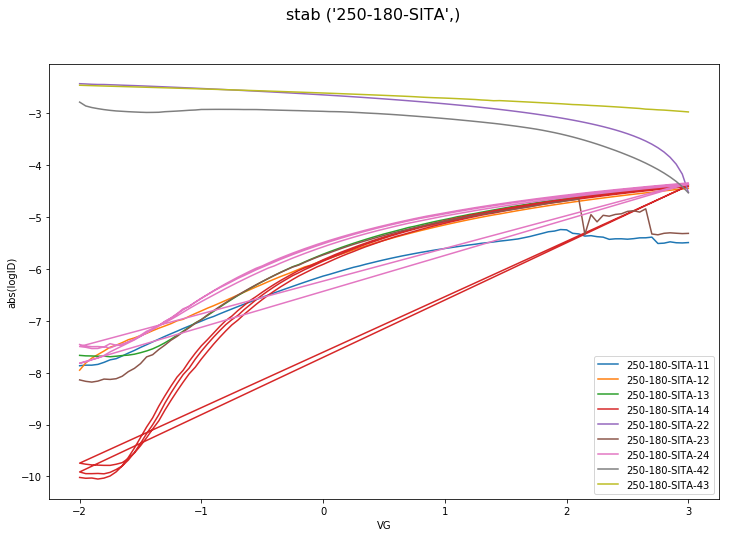

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

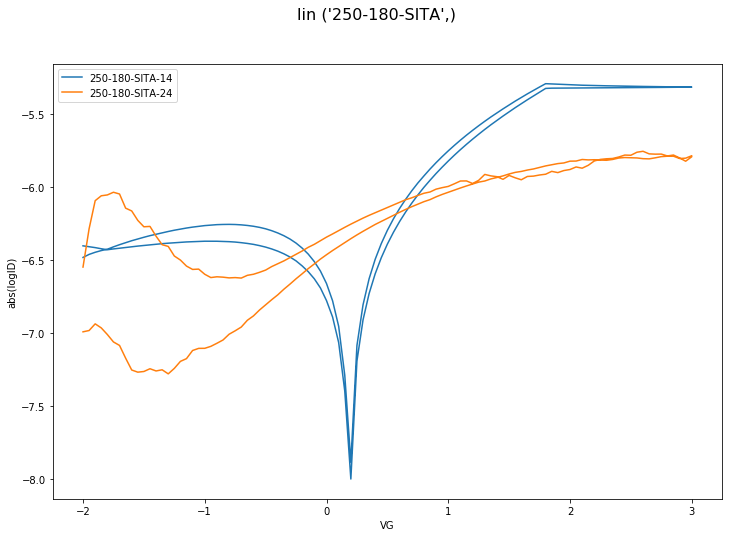

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

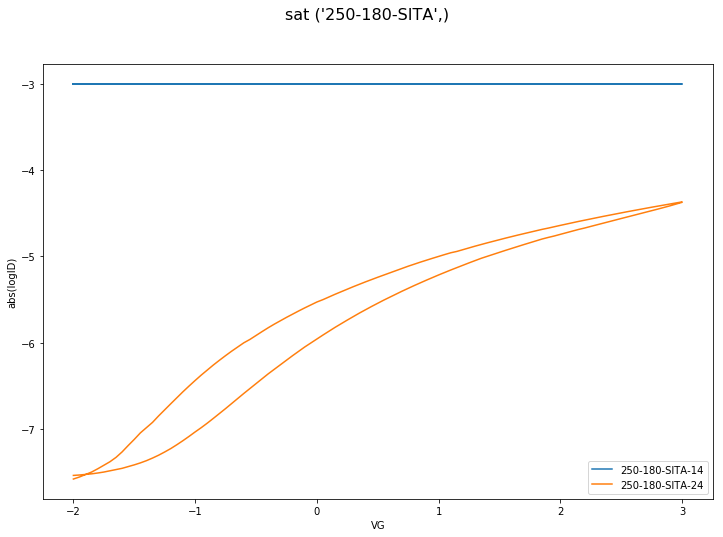

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

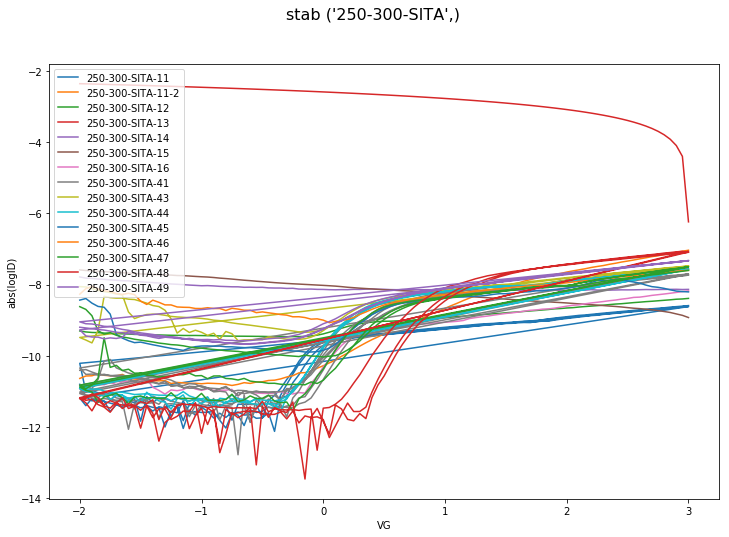

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:73: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

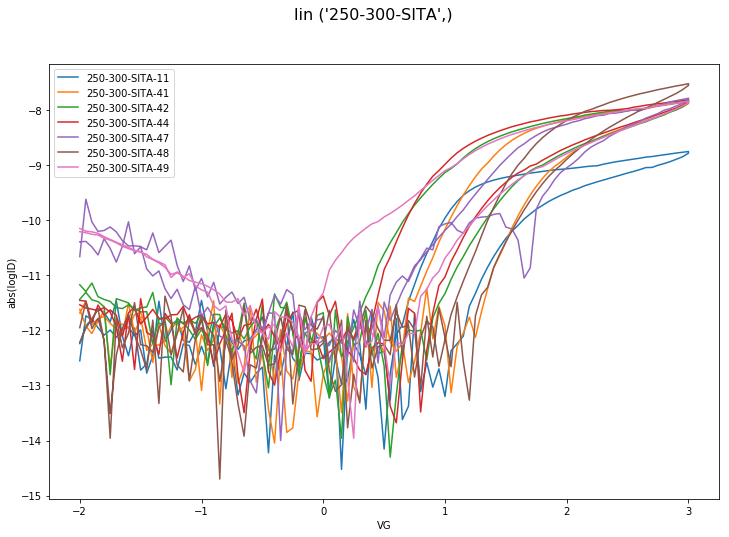

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

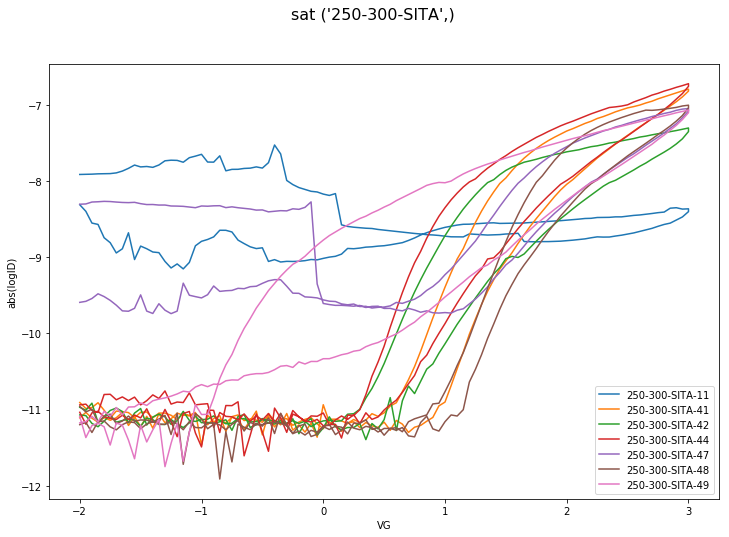

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

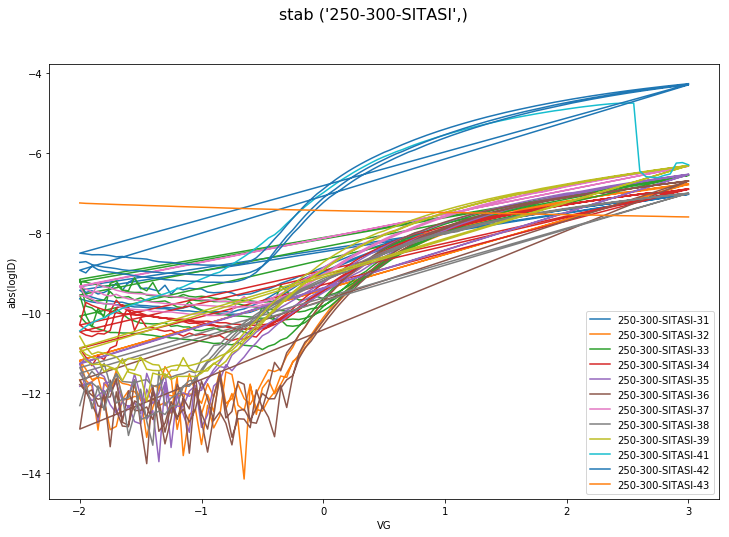

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

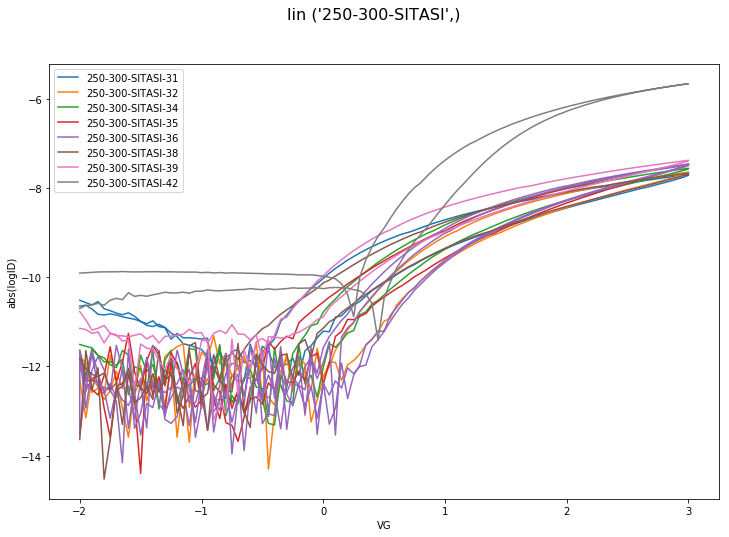

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

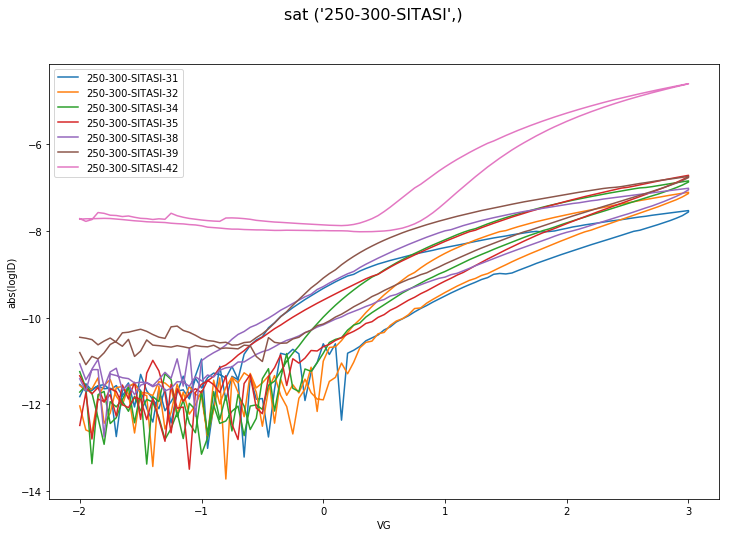

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

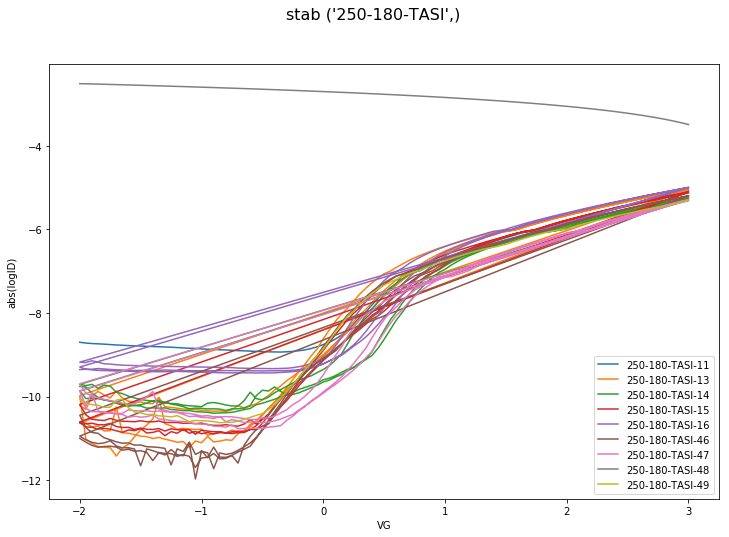

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

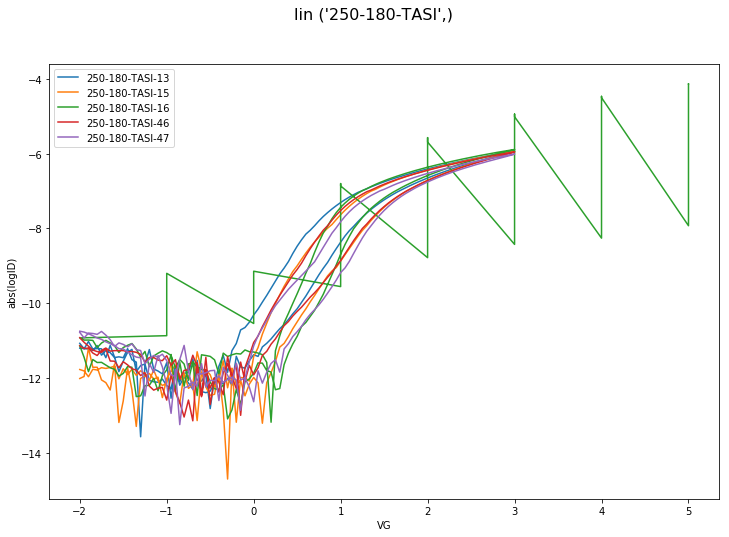

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

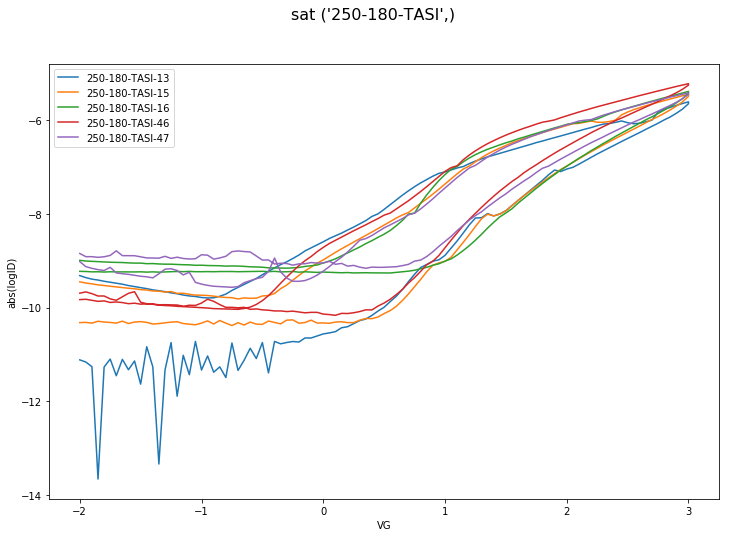

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

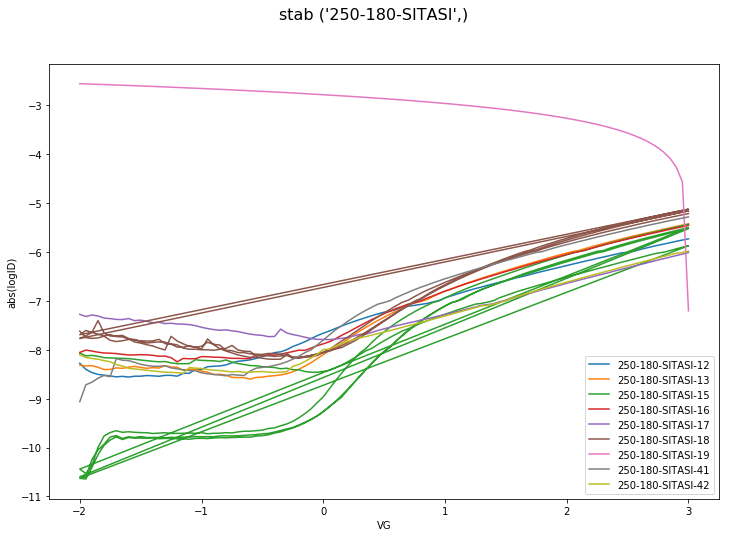

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

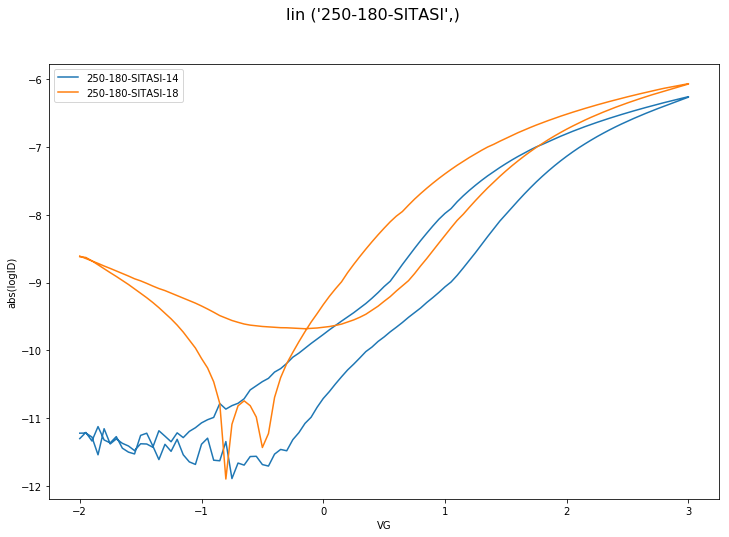

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

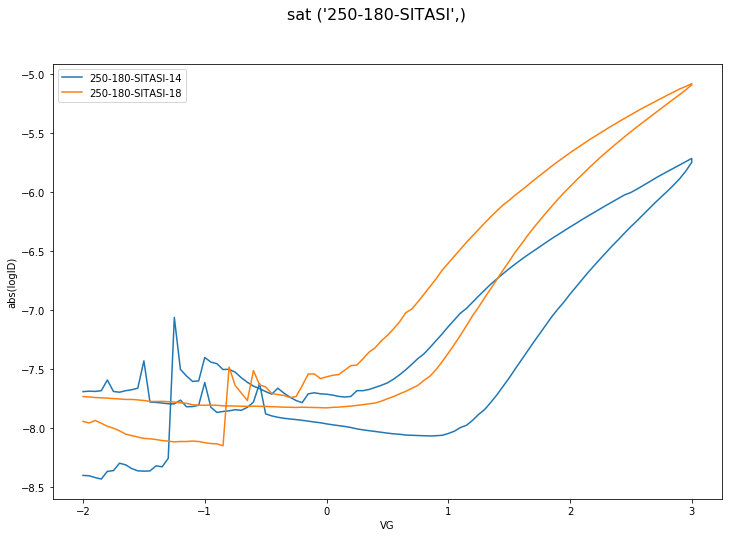

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

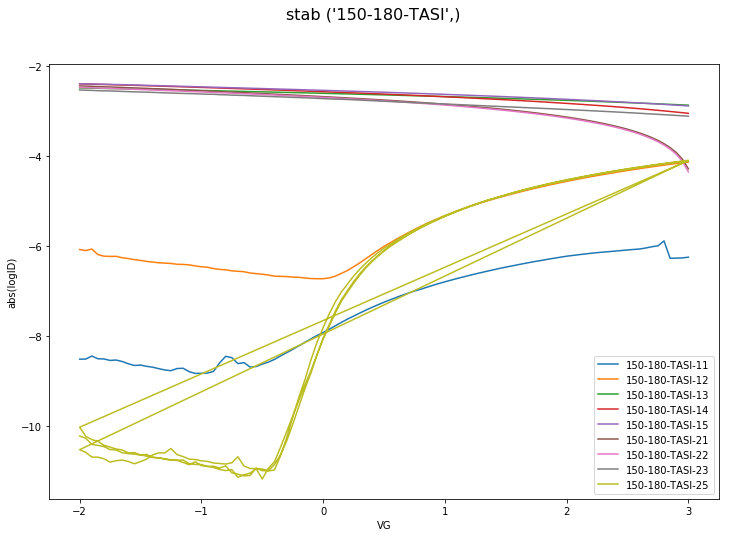

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

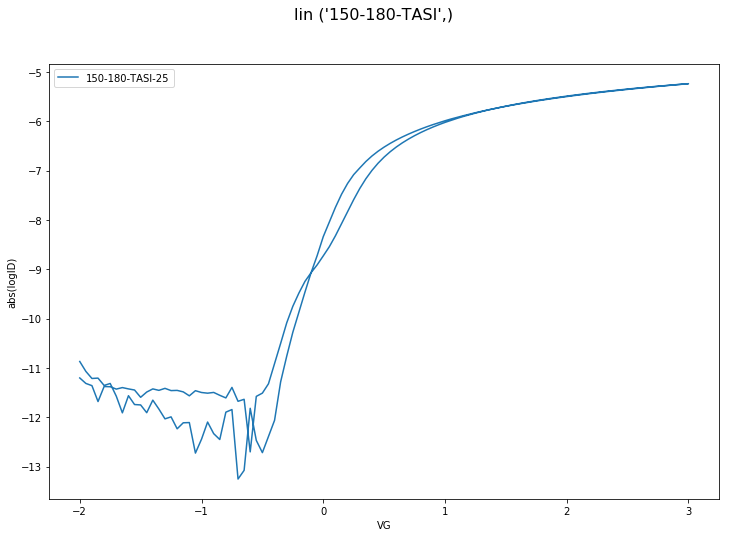

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

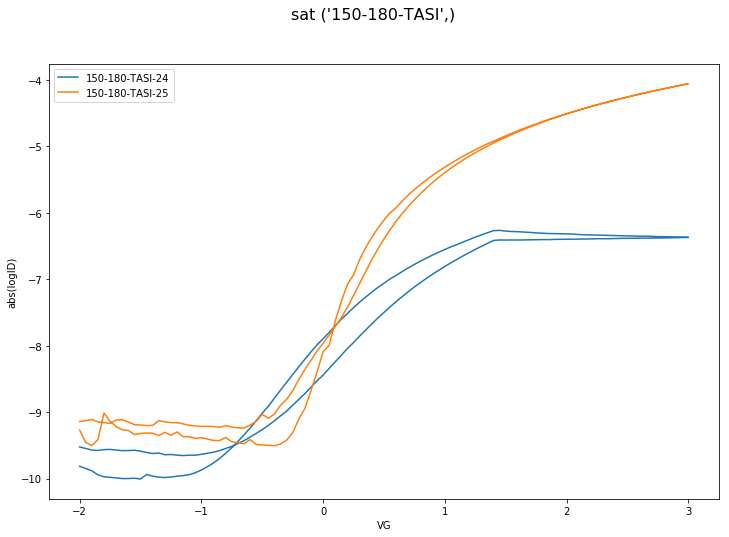

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

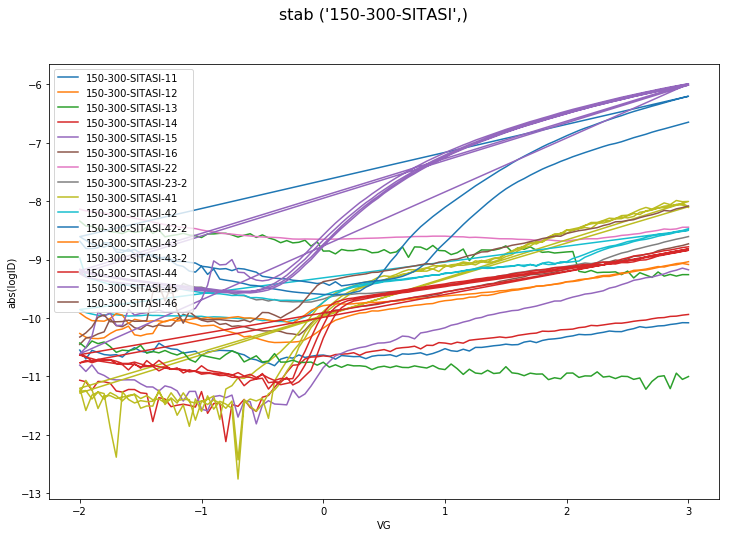

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

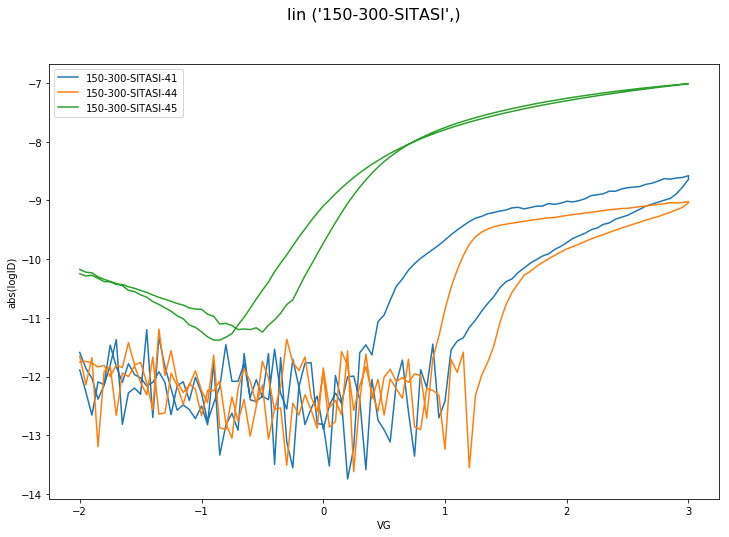

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

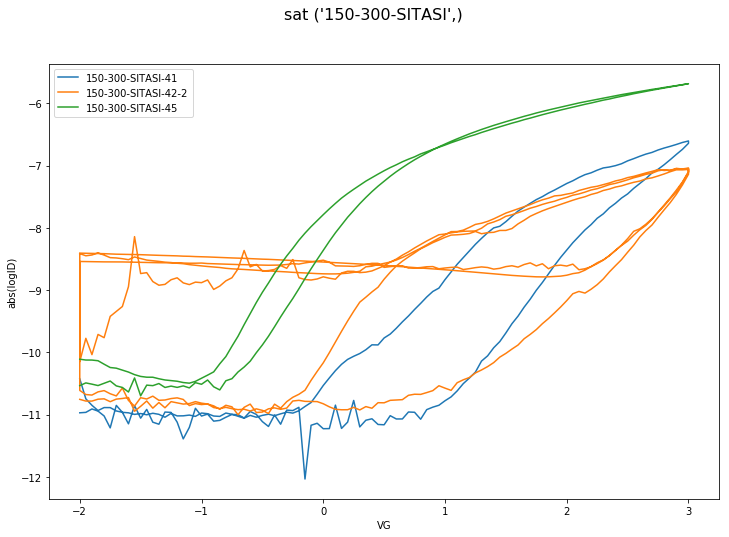

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

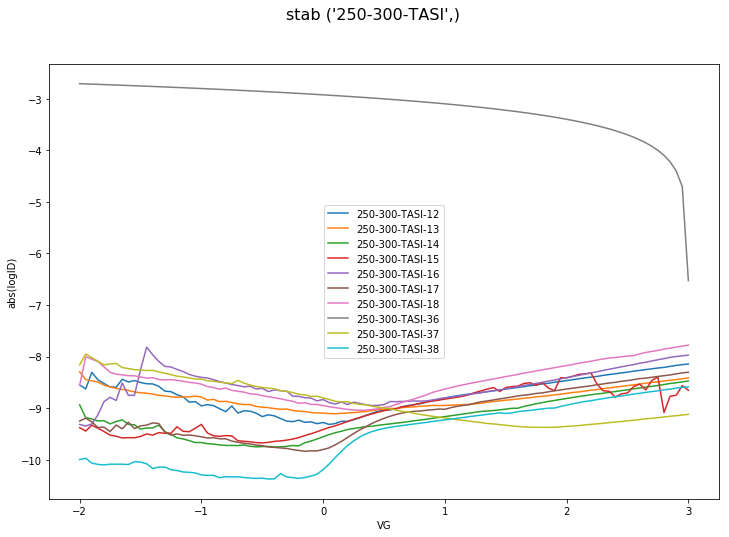

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

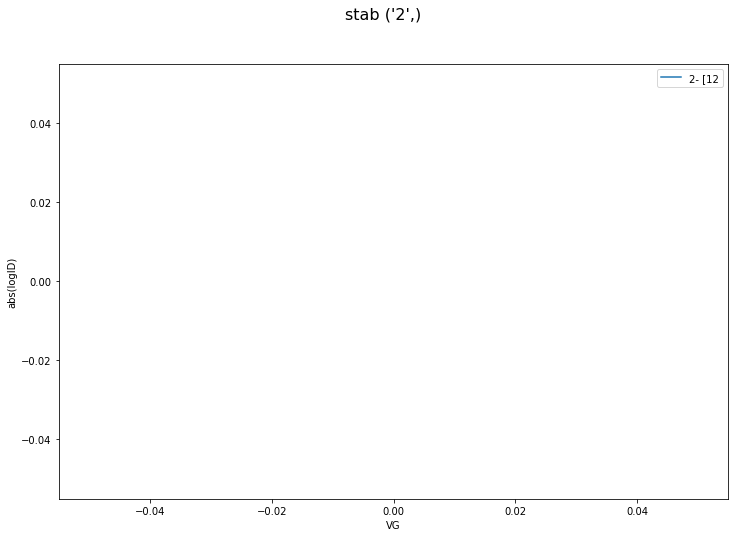

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:71: RuntimeWarning: divide by zero encountered in log10


<Figure size 216x216 with 0 Axes>

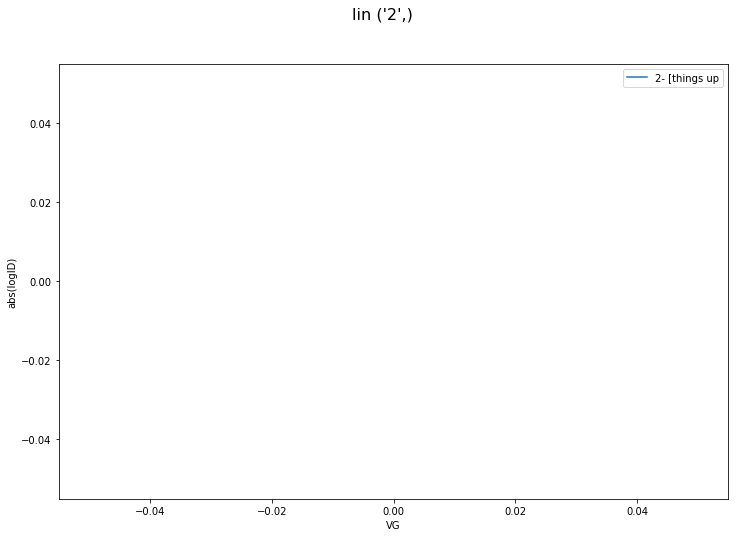

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

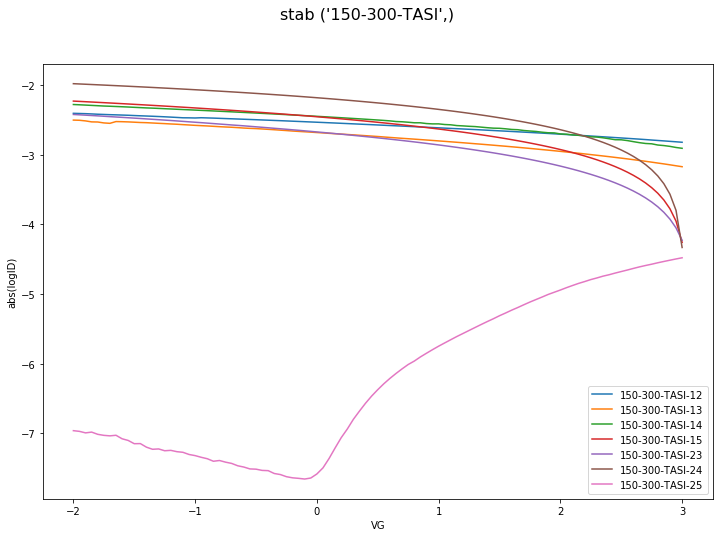

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

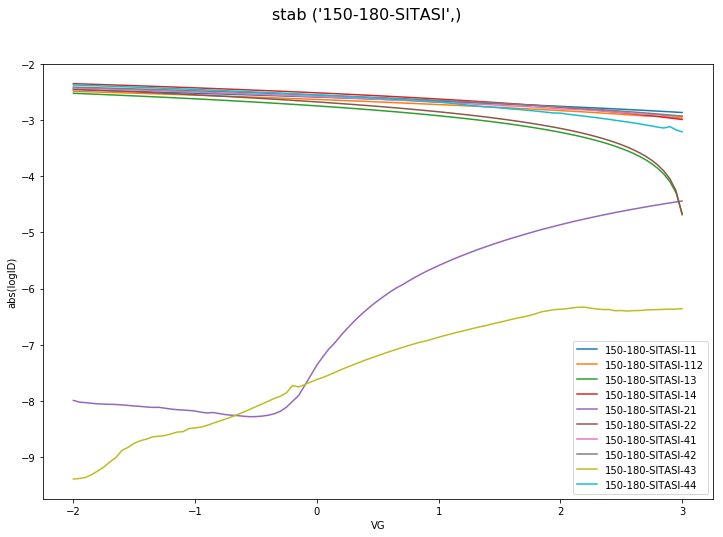

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<Figure size 216x216 with 0 Axes>

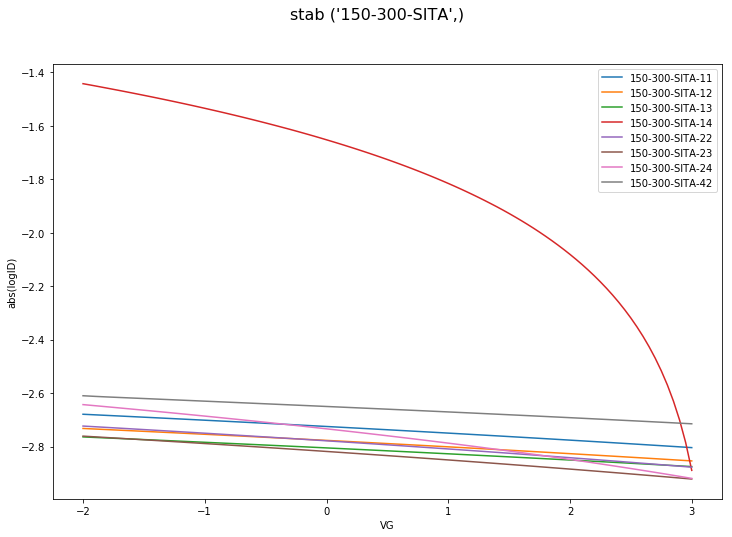

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

passed empty dataframe for lin


<Figure size 216x216 with 0 Axes>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
#@title Double widget graphs, Raw fields: { run: "auto", vertical-output: true }


Graph_division = "Sample" #@param {type:"string"}
user= list(Graph_division.split())

leakage = False #@param {type:"boolean"}



from __future__ import print_function
from google.colab import widgets
from google.colab import output
from matplotlib import pylab
from six.moves import zip


'dictionary contaning the keys we want to subset by '
params = {}  #https://stackoverflow.com/questions/1024847/add-new-keys-to-a-dictionary
sub=Subsetting()

"adding the unique values of the collumns to the dictionary "
for col in user: 
  params[col]=df[col].unique()
  

  

keys=list(params)

c= ((list(itertools.product(*map(params.get, keys))))) #https://stackoverflow.com/questions/32074543/how-to-get-the-length-of-an-itertools-product

title=[]
for i in range (len(c)):
  title.append(str(c[i]))
  
title
#the beginning of hte funciton  
    
def create_tab(location):
  tb = widgets.TabBar(['stab','lin', 'sat'], location=location)
  with tb.output_to('stab',  select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    stab_plot(df1, leakage=leakage, title=str(values))
  with tb.output_to('lin',  select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    lin_plot(df1, leakage=leakage, title=str(values))
  # Note you can access tab by its name (if they are unique), or
  # by its index.
  with tb.output_to(2, select=(i < 1)):
    pylab.figure(figsize=(3, 3))
    sat_plot(df1, leakage=leakage, title=str(values))  
  


# #tb = widgets.TabBar([str(i) for i in range(len(list(itertools.product(*map(params.get, keys)))))])    
tb = widgets.TabBar(title)
for i, values in enumerate (itertools.product(*map(params.get, keys))):
  df1=sub.SubsetVariable(df, **dict(zip(keys, values)))
  df1=sub.subset
  df1=df1.apply(pd.to_numeric, downcast='signed', errors='ignore')
  df1.reset_index()
  
  with tb.output_to(i, select=(i < 1)):
    create_tab('start')